<a href="https://colab.research.google.com/github/linhlinhle997/vae-mnist/blob/develop/cvae_audio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install numba==0.61.0
!pip install torchaudio==2.6.0
!pip install librosa==0.10.2.post1

In [ ]:
import os
import json
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt

import librosa
import librosa.display
import IPython.display as ipd
from IPython.display import Audio
from sklearn.preprocessing import MinMaxScaler

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchaudio
import torchaudio.transforms as T

In [ ]:
!gdown 1u2WzsWUlyZbbPDfXAWXuLRMTwFkT21wa
!unzip -q crawled_piano_audio_40_pages.zip -d piano_audio_files_40_pages

In [ ]:
def load_and_get_genres(json_path):
    """
    Load a JSON file and extract the list of genres.
    :param json_path: Path to the JSON file.
    :return: List of genres (or empty list if not found).
    """
    with open(json_path, "r") as f:
        data = json.load(f)

    return data.get("genres", [])


def load_and_resample_audio(file_path, target_sr=22050):
    """
    Load an audio file and resample it to the target sample rate if necessary.
    :param file_path: Path to the audio file.
    :param target_sr: Target sample rate (default 22050 Hz).
    :return: Tuple (audio signal, sample rate).
    """
    audio, sr = librosa.load(file_path, sr=None) # Load with original sample rate
    if sr != target_sr:
        audio = librosa.resample(audio, orig_sr=sr, target_sr=target_sr) # Resample if needed
    return audio, target_sr


def audio_to_melspec(audio, sr, n_mels, n_fft=2048, hop_length=512, to_db=False):
    """
    Convert an audio signal to a Mel spectrogram.
    :param audio: Audio signal array.
    :param sr: Sample rate.
    :param n_mels: Number of Mel bands.
    :param n_fft: FFT window size.
    :param hop_length: Hop length between frames.
    :param to_db: Convert to decibels if True.
    :return: Mel spectrogram.
    """
    spec = librosa.feature.melspectrogram(
        y=audio,
        sr=sr,
        n_fft=n_fft,
        hop_length=hop_length,
        win_length=None,
        window="hann",
        center=True,
        pad_mode="reflect",
        power=2.0,
        n_mels=n_mels
    )
    if to_db:
        spec = librosa.power_to_db(spec, ref=np.max) # Convert to decibel scale
    return spec


def normalize_melspec(melspec, norm_range=(0, 1)):
    """
    Normalize a Mel spectrogram using MinMax scaling.
    :param melspec: Input Mel spectrogram.
    :param norm_range: Normalization range (default [0,1]).
    :return: Normalized Mel spectrogram.
    """
    scaler = MinMaxScaler(feature_range=norm_range)
    melspec = melspec.T # Transpose for proper scaling
    melspec_normalized = scaler.fit_transform(melspec)
    return melspec_normalized.T # Transpose back


def denormalize_melspec(melspec_normalized, original_melspec, norm_range=(0, 1)):
    """
    Denormalize a Mel spectrogram back to its original scale.
    :param melspec_normalized: Normalized Mel spectrogram.
    :param original_melspec: Original (non-normalized) Mel spectrogram for reference.
    :param norm_range: Normalization range used previously.
    :return: Denormalized Mel spectrogram.
    """
    scaler = MinMaxScaler(feature_range=norm_range)
    mel_spec = original_melspec.T # Transpose original for fitting
    scaler.fit(mel_spec)
    melspec_denormalized = scaler.inverse_transform(melspec_normalized.T)
    return melspec_denormalized.T # Transpose back


def melspec_to_audio(melspec, sr, n_fft=2048, hop_length=512, n_iter=64):
    """
    Convert a Mel spectrogram back to an audio waveform.
    :param melspec: Mel spectrogram.
    :param sr: Sample rate.
    :param n_fft: FFT window size.
    :param hop_length: Hop length between frames.
    :param n_iter: Number of iterations for Griffin-Lim algorithm.
    :return: Reconstructed audio signal.
    """
    if np.any(melspec < 0): # Check if spectrogram is in dB scale
        melspec = librosa.db_to_power(melspec)

    audio_reconstructed = librosa.feature.inverse.mel_to_audio(
        melspec,
        sr=sr,
        n_fft=n_fft,
        hop_length=hop_length,
        win_length=None,
        window="hann",
        center=True,
        pad_mode="reflect",
        power=2.0,
        n_iter=n_iter
    )
    return audio_reconstructed


def display_audio_files(reconstructed_audio, sr, title="", original_audio=None):
    """
    Display the original and/or reconstructed audio using IPython.display.
    :param reconstructed_audio: Reconstructed audio waveform.
    :param sr: Sample rate.
    :param title: Title of the audio clip.
    :param original_audio: Original audio waveform (optional, for comparison).
    """
    if original_audio is not None:
        print("Original Audio:")
        ipd.display(ipd.Audio(original_audio, rate=sr))
        print("Reconstructed Audio (from Mel Spectrogram):")
    else:
        print(title)
    ipd.display(ipd.Audio(reconstructed_audio, rate=sr))


def show_spectrogram(spectrogram, title="Mel-Spectrogram", denormalize=False, is_numpy=False):
    """
    Display a Mel spectrogram using matplotlib.
    :param spectrogram: Mel spectrogram.
    :param title: Title for the plot.
    :param denormalize: Whether to denormalize before displaying.
    :param is_numpy: Whether the input is a numpy array.
    """
    if not is_numpy:
        spectrogram = spectrogram.squeeze().cpu().numpy() # Convert PyTorch tensor to numpy
    plt.figure(figsize=(10, 4))
    if denormalize:
        plt.imshow(spectrogram, aspect="auto", origin="lower", cmap="viridis")
    else:
        plt.imshow(spectrogram, aspect="auto", origin="lower", cmap="viridis", vmin=0, vmax=1)
    plt.title(title)
    plt.xlabel("Time")
    plt.ylabel("Mel Frequency")
    plt.colorbar()
    plt.show()

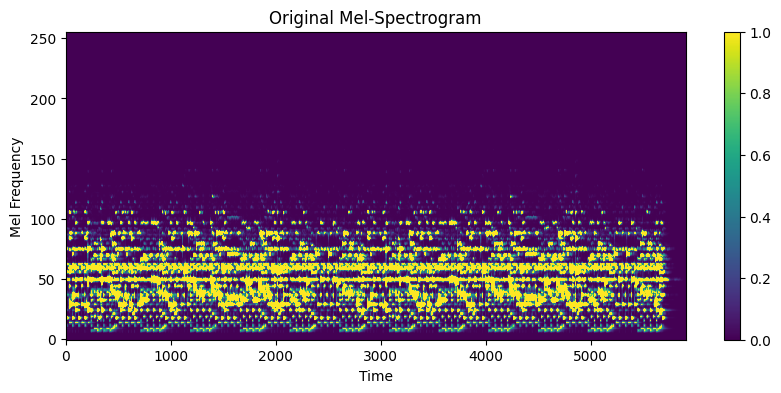

In [ ]:
json_dir = "/kaggle/working//piano_audio_files_40_pages/crawled_data"

audio, target_sr = load_and_resample_audio(
    os.path.join(json_dir, "audio", "audio_0001.mp3")
)

mel_spectrogram = audio_to_melspec(audio, target_sr, n_mels=256)

show_spectrogram(mel_spectrogram, title="Original Mel-Spectrogram", is_numpy=True)

In [ ]:
all_genres = []

for filename in os.listdir(json_dir):
    if filename.endswith(".json"):
        json_path = os.path.join(json_dir, filename)
        genres = load_and_get_genres(json_path)
        all_genres.extend(genres)

unique_genres = set(all_genres)
max_genres = len(unique_genres)

print("Number of unique genres:", max_genres)
print("Unique genres:", unique_genres)

Number of unique genres: 95
Unique genres: {'Trip-Hop', 'Indie-Rock', 'Improv', 'Avant-Garde', 'Electroacoustic', 'Sound Collage', 'Hip-Hop Beats', 'Singer-Songwriter', 'Radio', 'Sound Poetry', 'Jungle', 'International', 'Lo-fi Hip-Hop', 'Post-Rock', 'Jazz', 'Symphony', 'Rap', 'Nerdcore', 'Minimal Electronic', 'Mbaqanga', 'Ambient Electronic', 'Celtic', 'Halloween', 'hiphop', 'Rock', 'Lounge', 'Funk', 'Minimalism', 'Lo-fi Experimental', 'British Folk', 'Talk Radio', 'Sound Art', 'Ambient', 'Wonky', 'Downtempo', 'Spoken', 'Tango', 'Comedy', 'Easy Listening', 'Drone', 'Composed Music', 'Big Band/Swing', 'Historic', 'Dance', 'Instrumental', 'Jazz: Out', 'Techno', 'Pop', 'Radio Art', 'House', 'Lo-fi Instrumental', 'Christmas', 'Glitch', 'Afrobeat', 'Progressive', 'Alternative Hip-Hop', 'Gospel', 'New Wave', 'Space-Rock', 'Hip-Hop', 'Piano', 'Acoustic', 'Chill-out', 'Metal', 'Europe', 'Synth Pop', 'Blues', 'New Age', 'Vaporwave', 'Lo-fi Rock', 'Classical', 'Chamber Music', 'Soundtrack', 'Hi

In [ ]:
genres2idx = {genre: idx for idx, genre in enumerate(unique_genres)}
idx2genres = {idx: genre for genre, idx in genres2idx.items()}

In [ ]:
def tokenize(genres):
    return [genres2idx[genre] for genre in genres if genre in genres2idx]


def detokenize_tolist(tokens):
    return [idx2genres[token] for token in tokens if token in idx2genres]


def onehot_encode(tokens, max_genres):
    onehot = np.zeros(max_genres)
    onehot[tokens] = 1
    return onehot


def onehot_decode(onehot):
    return [idx for idx, val in enumerate(onehot) if val == 1]

## Audio Dataset

In [ ]:
class AudioDataset(Dataset):
    def __init__(self, data_dir, json_dir, sample_rate, duration, n_mels, n_genres, testset_amount=10):
        self.data_dir = data_dir
        self.json_dir = json_dir

        # Get list of all audio files in the directory
        self.files = [os.path.join(data_dir, f) for f in os.listdir(data_dir) if f.endswith(".mp3")]

        # Get list of all JSON metadata files
        self.json_files = [os.path.join(json_dir, f) for f in os.listdir(json_dir) if f.endswith(".json")]

        self.sample_rate = sample_rate
        self.duration = duration
        self.fixed_length = sample_rate * duration
        self.n_mels = n_mels
        self.n_genres = n_genres

        audios = []

        # Loop through each audio file and its corresponding JSON file
        for file_path, json_file_path in tqdm(zip(self.files, self.json_files),
                                              desc=f"Loading audio files in {data_dir}", unit="file",
                                              total=len(self.files)):
            # Load and resample audio to the target sample rate
            audio, sr = load_and_resample_audio(file_path, target_sr=sample_rate)

            # Load genre labels from JSON file
            genres_list = load_and_get_genres(json_file_path)
            genres_tokens = tokenize(genres_list)
            genres_input = onehot_encode(genres_tokens, n_genres)

            # Ensure genres_input is float32
            genres_input = torch.tensor(genres_input, dtype=torch.float32).unsqueeze(0)

            n_samples = len(audio)
            n_segments = n_samples // self.fixed_length

            for i in range(n_segments):
                start = i * self.fixed_length
                end = (i + 1) * self.fixed_length
                segment = audio[start:end]

                # Convert to Mel spectrogram
                mel_spec = audio_to_melspec(segment, sr, self.n_mels, to_db=True)
                mel_spec_norm = normalize_melspec(mel_spec)

                # Convert to PyTorch tensors
                mel_spec = torch.tensor(mel_spec, dtype=torch.float32).unsqueeze(0)
                mel_spec_norm = torch.tensor(mel_spec_norm, dtype=torch.float32).unsqueeze(0)

                audios.append((mel_spec_norm, genres_input, mel_spec))

        # Split dataset into training and test sets
        self.audios = audios[:len(audios) - testset_amount]
        self.testset = audios[len(audios) - testset_amount:]

        print(f"Loaded {len(self.audios)} audio segments from {len(self.files)} files, "
              f"each with shape: {self.audios[0][0].shape}, {self.audios[0][1].shape}, duration: {duration} seconds")
        print(f"Test set: {len(self.testset)} audio segments")

    def __len__(self):
        return len(self.audios)

    def __getitem__(self, idx):
        mel_spec_part, genres_input, mel_spec = self.audios[idx]
        return mel_spec_part, genres_input, mel_spec

In [ ]:
sample_rate = 22050
duration = 3
n_mels = 256
batch_size = 64

audio_dir = os.path.join(json_dir, "audio")

testset_amount = 32
trainset = AudioDataset(audio_dir, json_dir, sample_rate, duration, n_mels, max_genres, testset_amount=testset_amount)
testset = trainset.testset

print(f"Trainset size: {len(trainset)}")
print(f"Testset size: {len(testset)}")

Loading audio files in /kaggle/working//piano_audio_files_40_pages/crawled_data/audio: 100%|██████████| 793/793 [14:35<00:00,  1.10s/file]

Loaded 46035 audio segments from 793 files, each with shape: torch.Size([1, 256, 130]), torch.Size([1, 95]), duration: 3 seconds
Test set: 32 audio segments
Trainset size: 46035
Testset size: 32


In [ ]:
trainloader = DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=2)
testloader = DataLoader(testset, batch_size=batch_size, shuffle=False, num_workers=2)

print(f"Trainloader size: {len(trainloader)}")
print(f"Testloader size: {len(testloader)}")

Trainloader size: 720
Testloader size: 1


tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0.]])
130


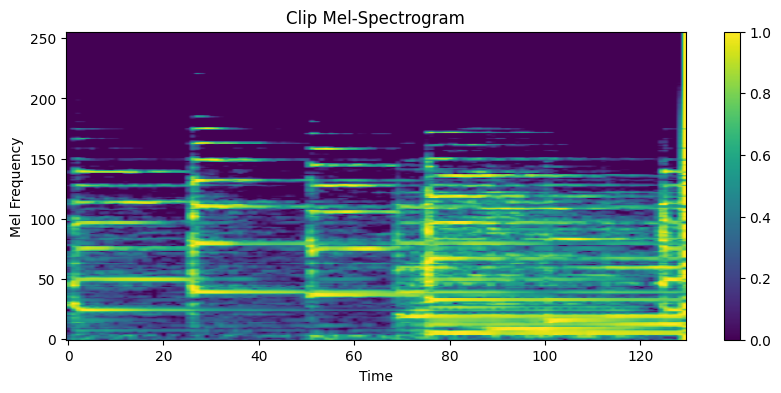

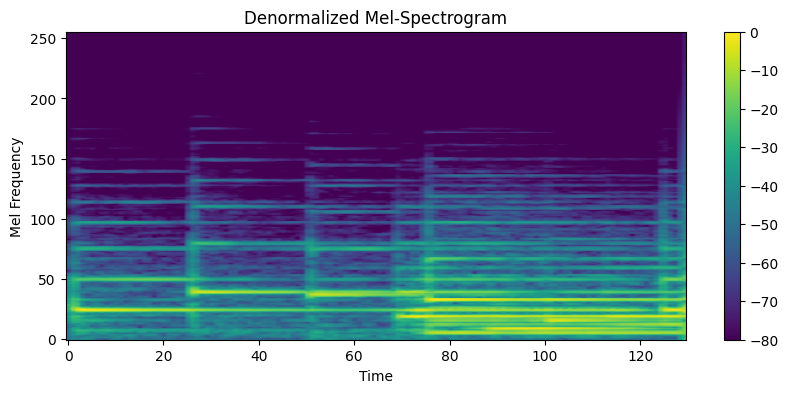

Original Audio after convert to Spectrogram and back to Audio


In [ ]:
audios = trainloader.dataset.audios.copy()

frame = audios[0][0].shape[-1]
print(audios[0][1])
print(frame)

for i in range(1):
    show_spectrogram(audios[i][0], title="Clip Mel-Spectrogram")
    spec_denorm = denormalize_melspec(audios[i][0].numpy().squeeze(), audios[i][2].numpy().squeeze())
    show_spectrogram(torch.tensor(spec_denorm), title="Denormalized Mel-Spectrogram", denormalize=True)
    audio_reconstructed = melspec_to_audio(spec_denorm, sample_rate)
    display_audio_files(audio_reconstructed, sample_rate, title="Original Audio after convert to Spectrogram and back to Audio")

## CVAE model

In [ ]:
class CVAE(nn.Module):
    def __init__(self, d_model, latent_dim, n_frames, n_mels, n_genres):
        super(CVAE, self).__init__()
        self.d_model = d_model
        self.latent_dim = latent_dim

        # Adjusting frame and mel dimensions based on convolutional layers
        self.n_frames = int(np.ceil(n_frames / 2**3)) # Downsampled by factor of 2^3 = 8
        self.n_mels = int(np.ceil(n_mels / 2**3)) # Downsampled by factor of 8
        self.n_genres = n_genres
        print(self.n_frames, self.n_mels)

       # Encoder: Downsampling input
        self.encoder = nn.Sequential(
            nn.Conv2d(1 + self.n_genres, d_model, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(d_model),
            nn.SiLU(),
            nn.Dropout2d(0.05),

            nn.Conv2d(d_model, d_model * 2, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(d_model * 2),
            nn.SiLU(),
            nn.Dropout2d(0.1),

            nn.Conv2d(d_model * 2, d_model * 4, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(d_model * 4),
            nn.SiLU(),
            nn.Dropout2d(0.15),

            nn.AdaptiveAvgPool2d((1, 1)), # Global pooling to reduce to (1,1)
            nn.Flatten()
        )

        # Latent space mapping
        self.fc_mu = nn.Linear(d_model * 4, latent_dim) # Mean
        self.fc_logvar = nn.Linear(d_model * 4, latent_dim) # Log variance

         # Decoder: Upsampling to reconstruct input
        self.decoder_input = nn.Linear(latent_dim + self.n_genres, d_model * 4 * self.n_frames * self.n_mels)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(d_model * 4, d_model * 2, kernel_size=3, stride=2, padding=1, output_padding=(1, 0)),
            nn.BatchNorm2d(d_model * 2),
            nn.SiLU(),
            nn.Dropout2d(0.1),

            nn.ConvTranspose2d(d_model * 2, d_model, kernel_size=3, stride=2, padding=1, output_padding=(1, 0)),
            nn.BatchNorm2d(d_model),
            nn.SiLU(),
            nn.Dropout2d(0.05),

            nn.ConvTranspose2d(d_model, 1, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.Sigmoid(), # Normalize output between 0 and 1
        )

    def reparameterize(self, mu, logvar):
        """Apply reparameterization trick to sample from a Gaussian distribution."""
        std = torch.exp(0.5 * logvar) # Convert log variance to standard deviation
        eps = torch.randn_like(std) # Sample noise
        return mu + eps * std

    def forward(self, x, genres_input):
        x = x.float()
        genres_input = genres_input.float()

        # Expand genre input to match spectrogram dimensions
        ori_genres_embed = genres_input.view(genres_input.size(0), -1)
        genres_embed = ori_genres_embed.unsqueeze(-1).unsqueeze(-1) # Expand dimensions
        genres_embed = genres_embed.expand(-1, -1, x.size(2), x.size(3))

        # Concatenate genre embeddings with input spectrogram
        x_genres = torch.cat((x, genres_embed), dim=1)

        # Encoder forward pass
        h = x_genres
        shortcuts = []
        for block in self.encoder:
            h = block(h)
            if isinstance(block, nn.SiLU):  # Storing shortcut connections
                shortcuts.append(h)

        # Compute mean and log variance for latent distribution
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)

        # Reparameterize to get latent vector
        z = self.reparameterize(mu, logvar)

        # Concatenate latent vector with genre embeddings
        z_genres = torch.cat((z, ori_genres_embed), dim=1)

        # Expand latent vector into feature map for decoding
        h_dec = self.decoder_input(z_genres)
        h_dec = h_dec.view(-1, self.d_model * 4, self.n_frames, self.n_mels) # Reshape for decoding

        # Decoder forward pass
        for block in self.decoder:
            if isinstance(block, nn.ConvTranspose2d) and shortcuts:
                shortcut = shortcuts.pop()
                if h_dec.shape == shortcut.shape:
                    h_dec = h_dec + shortcut
            h_dec = block(h_dec)

        # Ensure output matches input dimensions
        recon = h_dec[:, :, :x.size(2), :x.size(3)]
        return recon, mu, logvar

In [ ]:
def loss_function(recon_x, x, mu, logvar):
    recon_loss = nn.functional.mse_loss(recon_x, x, reduction="sum")
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return recon_loss + KLD

In [ ]:
def train(model, dataloader, optimizer, scheduler, num_epochs, device, verbose_interval=50):
    model.train()
    losses = []

    for epoch in tqdm(range(num_epochs), desc="Training", unit="epoch"):
        train_loss = 0
        for batch_idx, (data, genres_input, ori_data) in enumerate(dataloader):
            data = data.to(device, dtype=torch.float32)
            genres_input = genres_input.to(device, dtype=torch.float32)

            optimizer.zero_grad()
            recon, mu, logvar = model(data, genres_input)
            loss = loss_function(recon, data, mu, logvar)
            train_loss += loss.item()
            loss.backward()
            optimizer.step()
    scheduler.step()
    avg_loss = train_loss / len(dataloader.dataset)
    losses.append(avg_loss)
    print(f"Epoch {epoch}|{num_epochs}, Loss: {avg_loss:.4f}, Lr: {scheduler.get_last_lr()[0]}")

    if epoch == 0 or (epoch + 1) % verbose_interval == 0:
        data = data[0].detach().cpu()
        recon_img = recon[0].detach().cpu()
        show_spectrogram(data, title="Original Mel-Spectrogram")
        show_spectrogram(recon_img, title="Reconstructed Mel-Spectrogram")
    return mu, logvar, losses

32 17
Total number of parameters: 32056001


Training: 100%|██████████| 100/100 [4:31:22<00:00, 162.82s/epoch] 


Epoch 99|100, Loss: 2.2220, Lr: 0.0002


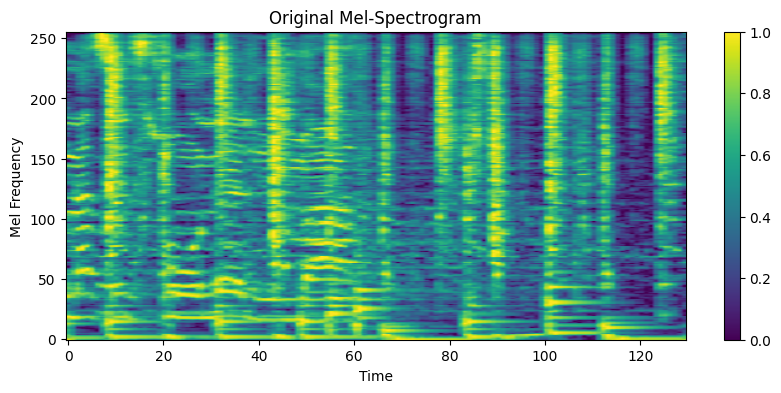

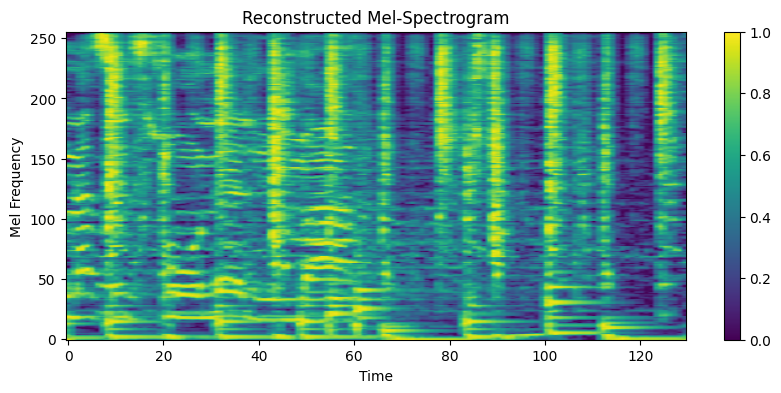

In [ ]:
d_model = 64
latent_dim = 128
lr = 2e-4
num_epochs = 100
step_size = num_epochs//2
verbose_interval = num_epochs//10
gamma = 0.5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = CVAE(d_model, latent_dim, n_mels, frame, max_genres).to(device)
optimizer = optim.Adam(model.parameters(), lr=lr)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=step_size, gamma=gamma)

print(f"Total number of parameters: {sum(p.numel() for p in model.parameters())}")
mu, logvar, losses = train(
    model,
    trainloader,
    optimizer,
    scheduler,
    num_epochs,
    device,
    verbose_interval=verbose_interval,
)

In [ ]:
torch.save(model.state_dict(), "model_checkpoint.pth")

model = CVAE(d_model, latent_dim, n_mels, frame, max_genres).to(device)
model.load_state_dict(torch.load("model_checkpoint.pth"))
model.eval()

32 17


CVAE(
  (encoder): Sequential(
    (0): Conv2d(96, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): SiLU()
    (3): Dropout2d(p=0.05, inplace=False)
    (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): SiLU()
    (7): Dropout2d(p=0.1, inplace=False)
    (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): SiLU()
    (11): Dropout2d(p=0.15, inplace=False)
    (12): AdaptiveAvgPool2d(output_size=(1, 1))
    (13): Flatten(start_dim=1, end_dim=-1)
  )
  (fc_mu): Linear(in_features=256, out_features=128, bias=True)
  (fc_logvar): Linear(in_features=256, out_features=128, bias=True)
  (decoder_input): Linear(in_features=223, out_features=139264, bias=T

<ipython-input-18-0c67558dbde6>:26: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


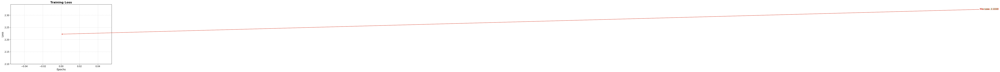

In [ ]:
def plot_losses(losses, title="Training Loss", xlabel="Epochs", ylabel="Loss", color='b', grid=True):
    plt.figure(figsize=(12, 6))
    plt.plot(losses, color=color, linewidth=2)
    plt.title(title, fontsize=16, fontweight="bold")
    plt.xlabel(xlabel, fontsize=14)
    plt.ylabel(ylabel, fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(grid, linestyle="--", alpha=0.6)

    min_loss_idx = losses.index(min(losses))
    max_loss_idx = losses.index(max(losses))

    plt.annotate(f"Min Loss: {min(losses):.4f}",
                 xy=(min_loss_idx, min(losses)),
                 xytext=(min_loss_idx + 1, min(losses) + 0.1),
                 arrowprops=dict(arrowstyle="->", color="green"),
                 fontsize=12, color='green')

    plt.annotate(f"Max Loss: {max(losses):.4f}",
                 xy=(max_loss_idx, max(losses)),
                 xytext=(max_loss_idx + 1, max(losses) + 0.1),
                 arrowprops=dict(arrowstyle="->", color="red"),
                 fontsize=12, color="red")

    plt.tight_layout()
    plt.show()

plot_losses(losses)

## Inference

In [ ]:
def inference(model, testloader):
    model.eval()
    with torch.no_grad():
        data, genres_input, ori_data = next(iter(testloader))
        data = data.to(device)
        genres_input = genres_input.to(device)
        recon, _, _ = model(data, genres_input)
        return recon, genres_input, ori_data

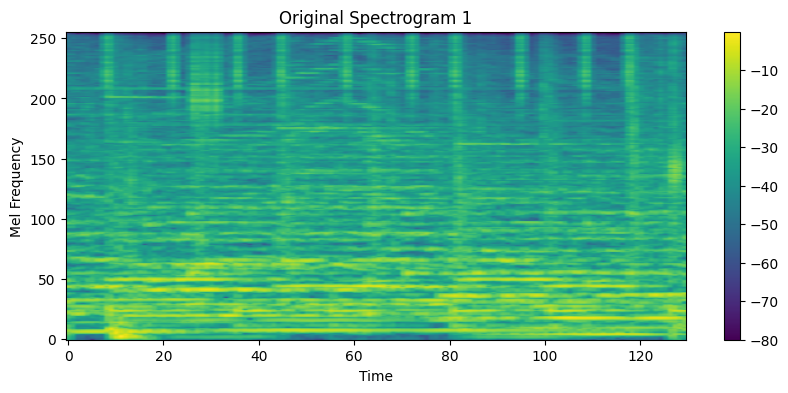

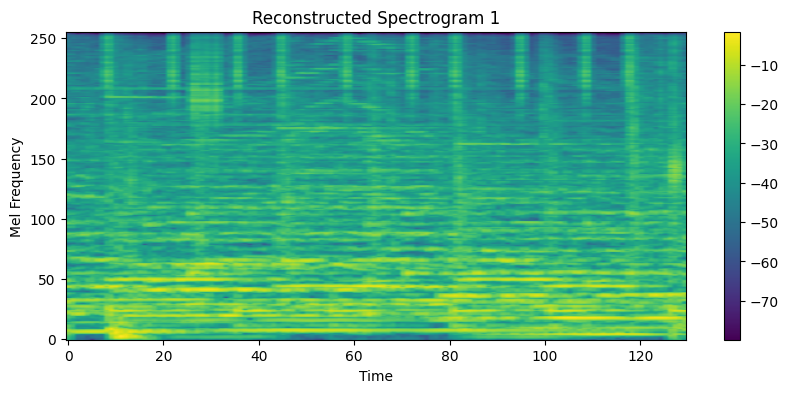

Original Audio:


Reconstructed Audio (from Mel Spectrogram):


----------------------------------------------------------------------------------------------------



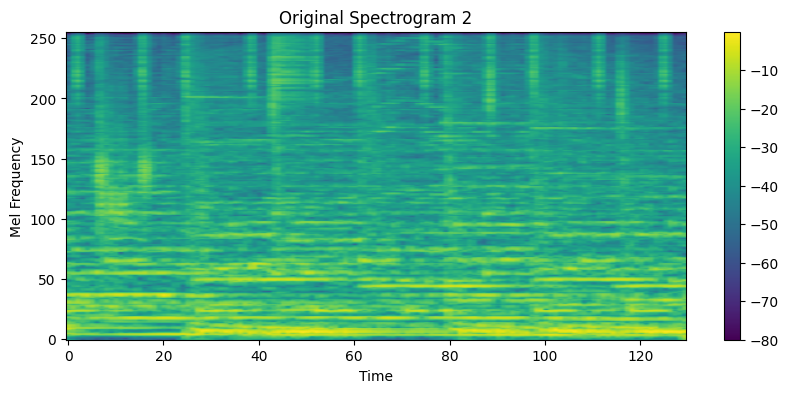

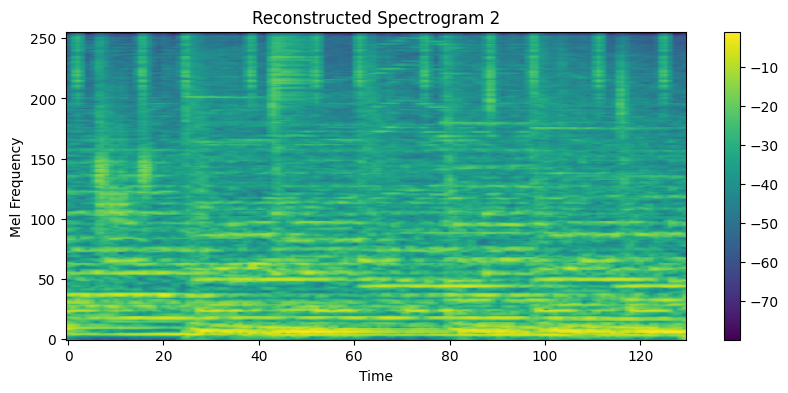

Original Audio:


Reconstructed Audio (from Mel Spectrogram):


----------------------------------------------------------------------------------------------------



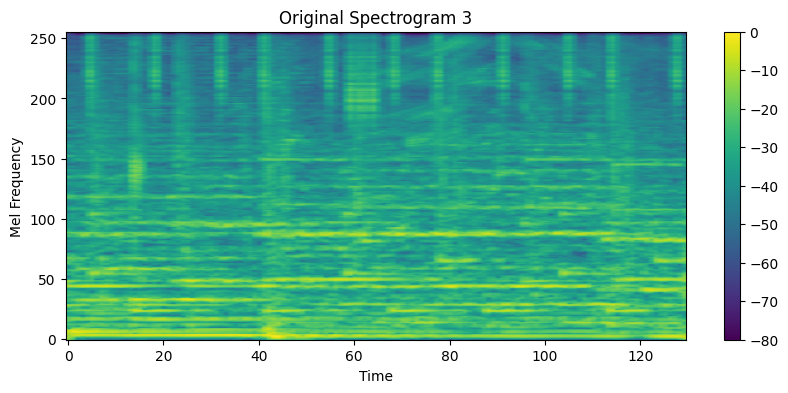

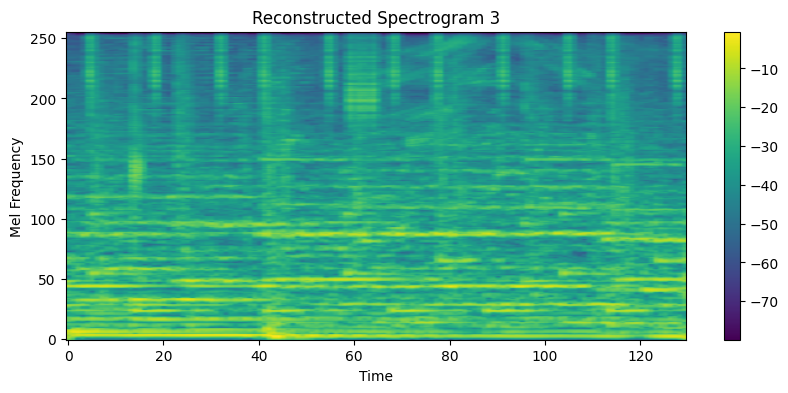

Original Audio:


Reconstructed Audio (from Mel Spectrogram):


----------------------------------------------------------------------------------------------------



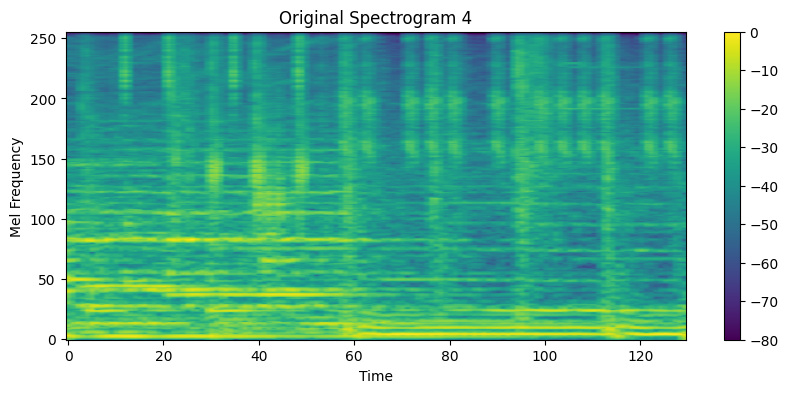

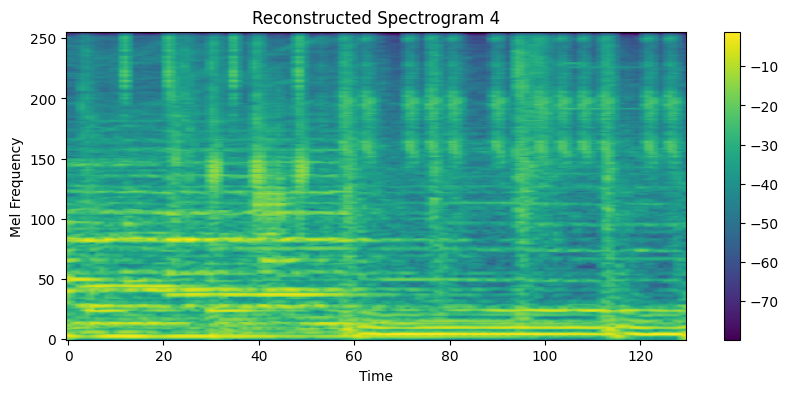

Original Audio:


Reconstructed Audio (from Mel Spectrogram):


----------------------------------------------------------------------------------------------------



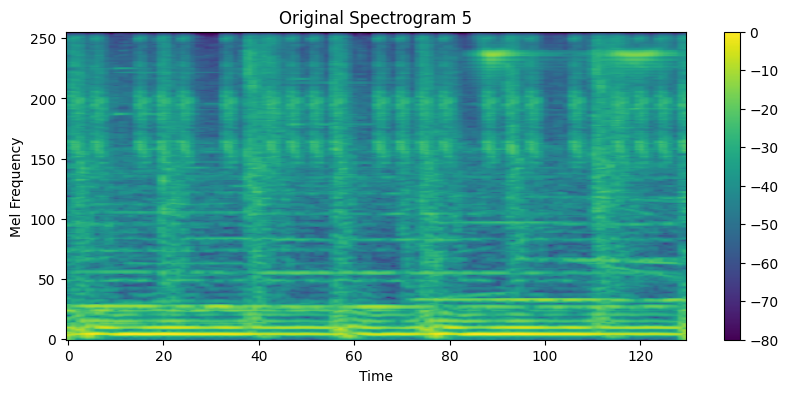

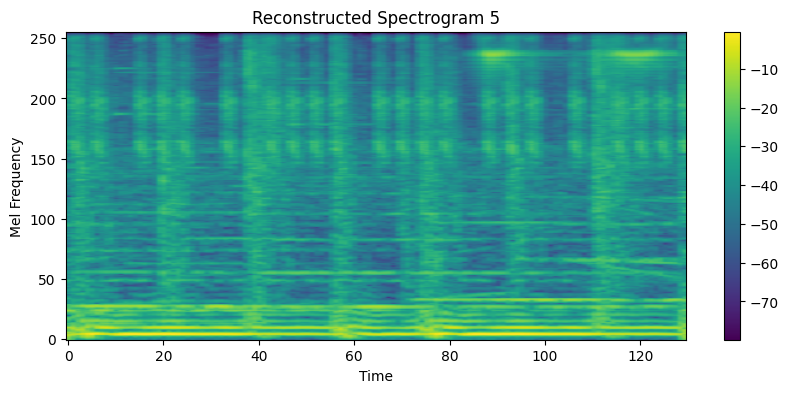

Original Audio:


Reconstructed Audio (from Mel Spectrogram):


----------------------------------------------------------------------------------------------------

Connect all original audio


Connect all reconstructed audio


In [ ]:
gen_mels, genres_input, ori_data = inference(model, testloader)
recon_audios = []
ori_audios = []

for i in range(len(gen_mels[:5])):
    show_spectrogram(ori_data[i], title=f"Original Spectrogram {i+1}", denormalize=True)
    ori_reconstructed = melspec_to_audio(ori_data[i].cpu().numpy().squeeze(), sample_rate)
    ori_audios.append(ori_reconstructed)

    spec_denorm = denormalize_melspec(gen_mels[i].cpu().numpy().squeeze(), ori_data[i].cpu().numpy().squeeze())
    show_spectrogram(spec_denorm, title=f"Reconstructed Spectrogram {i+1}", denormalize=True, is_numpy=True)
    audio_reconstructed = melspec_to_audio(spec_denorm, sample_rate)
    recon_audios.append(audio_reconstructed)

    display_audio_files(audio_reconstructed, sample_rate, original_audio=ori_reconstructed)
    print("-"*100, end="\n\n")

ori_audios = np.concatenate(ori_audios)
display_audio_files(ori_audios, sample_rate, title="Connect all original audio")
recon_audios = np.concatenate(recon_audios)
display_audio_files(recon_audios, sample_rate, title="Connect all reconstructed audio")

## Inference (generative)

In [ ]:
def generate(model, dataloader, genres_list, num_samples=5, diff_level=1):
    model.eval()
    with torch.no_grad():
        data, old_genres_input, ori_data = next(iter(dataloader))
        data = data.to(device)

        genres_tokens = tokenize(genres_list)
        genres_input = onehot_encode(genres_tokens, model.n_genres)
        genres_input = torch.tensor(genres_input, dtype=torch.long).unsqueeze(0)
        genres_input = genres_input.repeat(old_genres_input.shape[0], 1)
        genres_input = genres_input.to(device)

        recon, mu, logvar = model(data, genres_input)
        ori_audios = []
        recon_audios = []
        for i in range(num_samples):
            old_genres_list = detokenize_tolist(onehot_decode(old_genres_input[i].squeeze().tolist()))
            show_spectrogram(data[i], title="Original Spectrogram with Genres: " + ", ".join(old_genres_list))
            show_spectrogram(recon[i], title="Reconstructed Spectrogram with Genres: " + ", ".join(genres_list))

            diff_spectrogram = torch.abs(data[i] - recon[i]) * diff_level
            show_spectrogram(diff_spectrogram, title=f"Difference Spectrogram (|Original - Reconstructed|) * {diff_level}")
            print("Loss: ", loss_function(recon[i], data[i], mu, logvar).item())

            spec_denorm = denormalize_melspec(recon[i].cpu().numpy().squeeze(), ori_data[i].cpu().numpy().squeeze())
            audio_reconstructed = melspec_to_audio(spec_denorm, sr=sample_rate)
            ori_audio = melspec_to_audio(ori_data[i].cpu().numpy().squeeze(), sr=sample_rate)

            recon_audios.append(audio_reconstructed)
            ori_audios.append(ori_audio)

            display_audio_files(ori_audio, sample_rate, title="Reconstructed Audio with Genres: " + ", ".join(old_genres_list))
            display_audio_files(audio_reconstructed, sample_rate, title="Reconstructed Audio with Genres: " + ", ".join(genres_list))

        if num_samples > 1:
            print("-"*100, "Connect all audio", "-"*100)
            recon_ori_audios = np.concatenate(ori_audios)
            display_audio_files(recon_ori_audios, sample_rate, title="Connect all original audio")
            recon_audios = np.concatenate(recon_audios)
            display_audio_files(recon_audios, sample_rate, title="Connect all reconstructed audio")

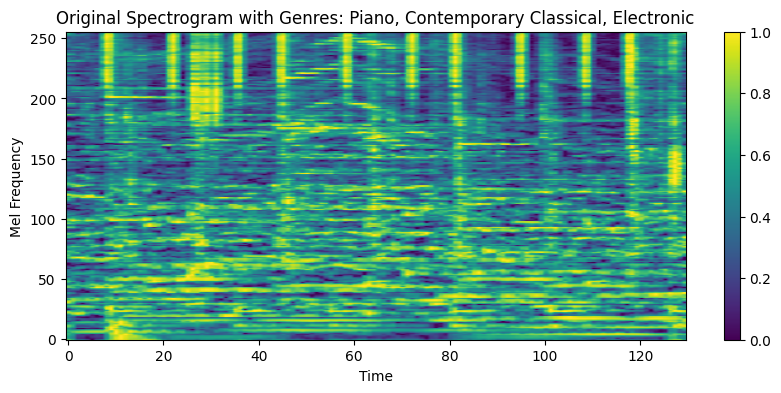

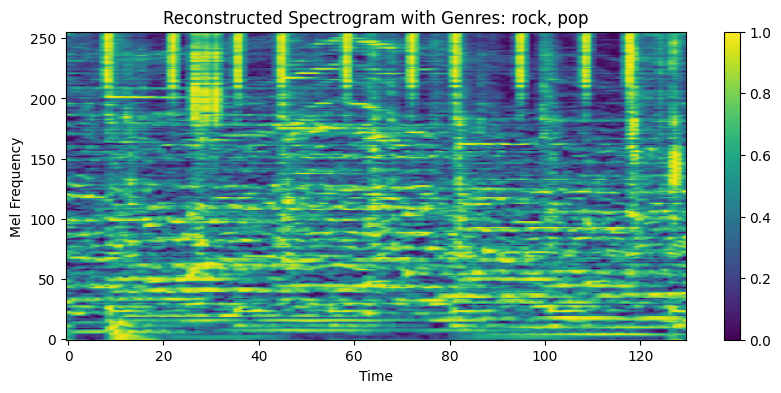

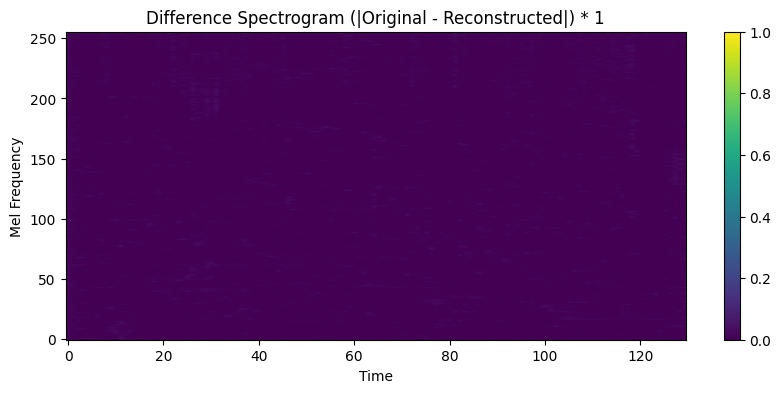

Loss:  1.2324845790863037
Reconstructed Audio with Genres: Piano, Contemporary Classical, Electronic


Reconstructed Audio with Genres: rock, pop


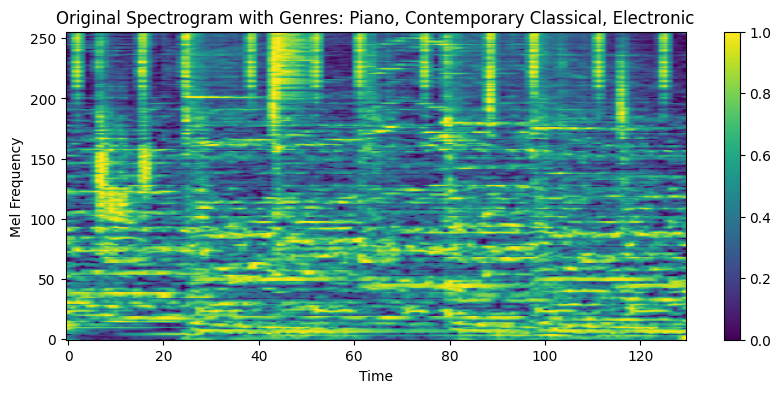

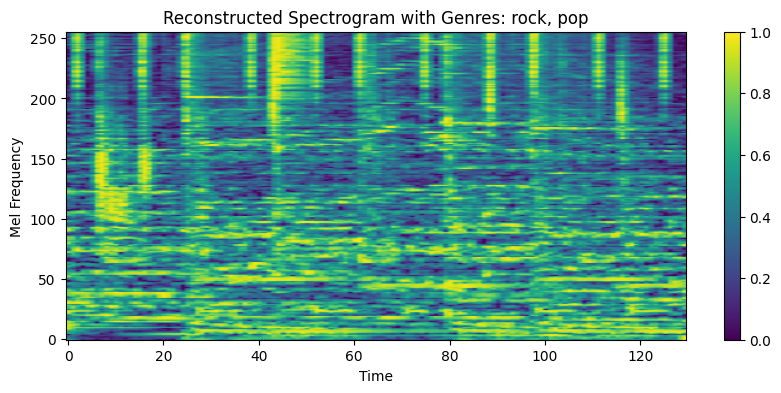

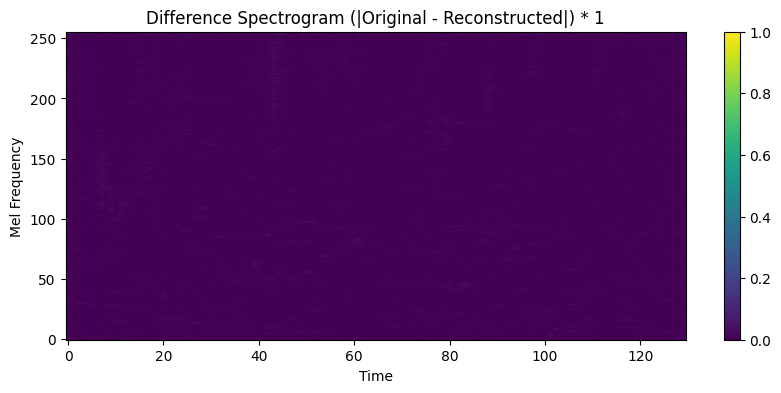

Loss:  1.2811555862426758
Reconstructed Audio with Genres: Piano, Contemporary Classical, Electronic


Reconstructed Audio with Genres: rock, pop


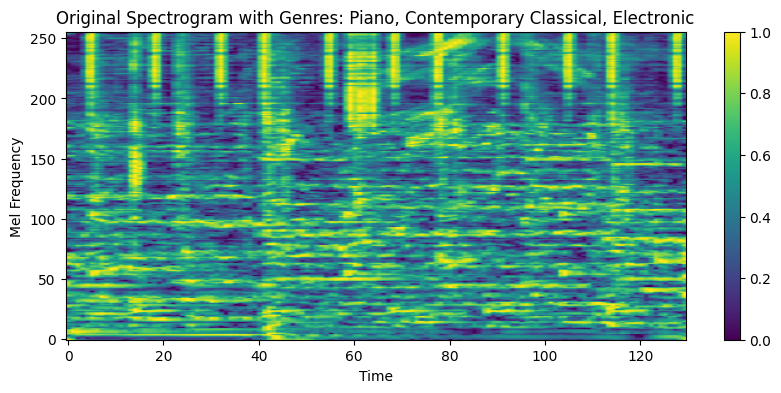

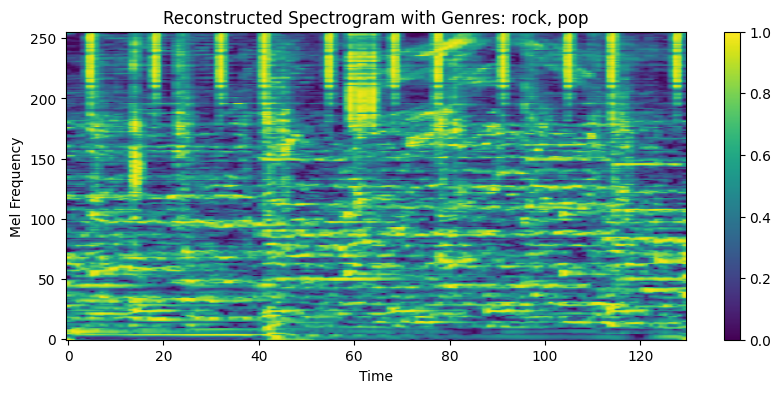

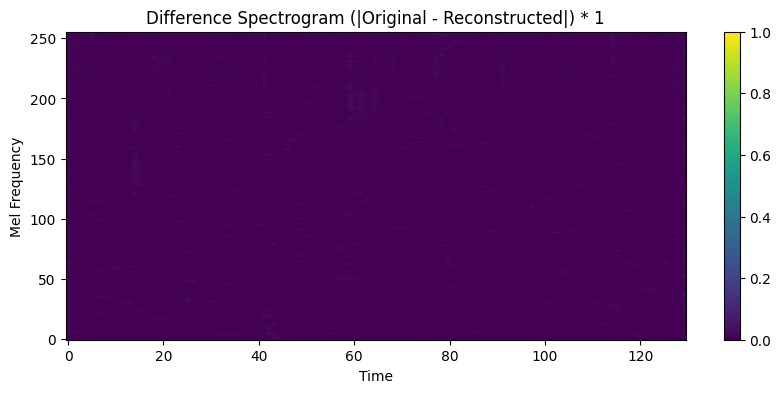

Loss:  1.2851223945617676
Reconstructed Audio with Genres: Piano, Contemporary Classical, Electronic


Reconstructed Audio with Genres: rock, pop


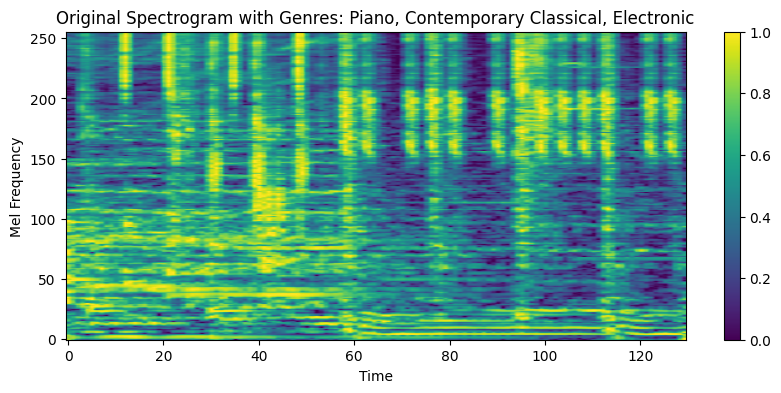

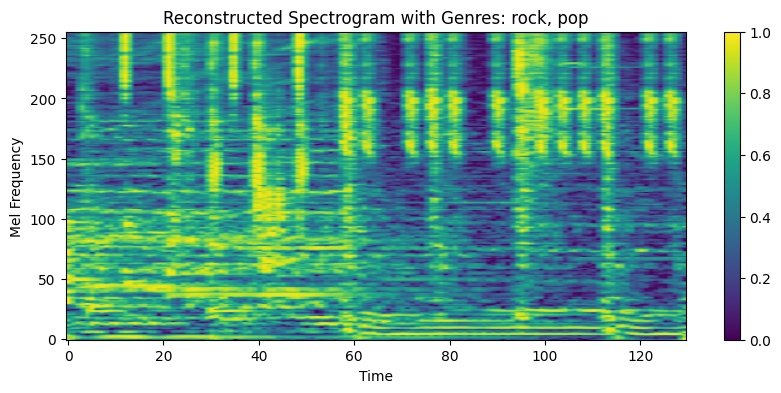

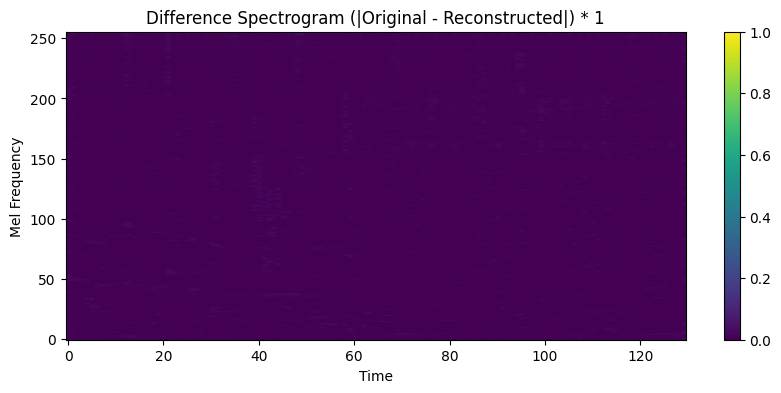

Loss:  1.3617115020751953
Reconstructed Audio with Genres: Piano, Contemporary Classical, Electronic


Reconstructed Audio with Genres: rock, pop


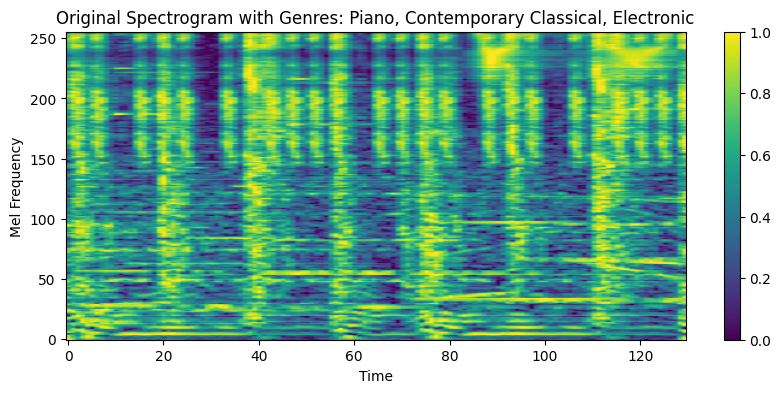

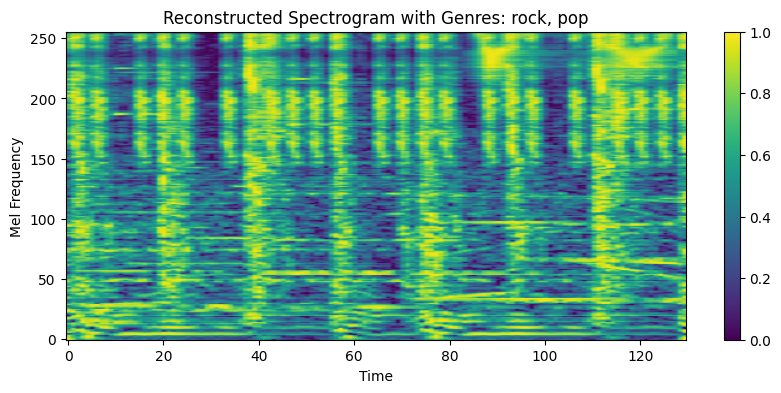

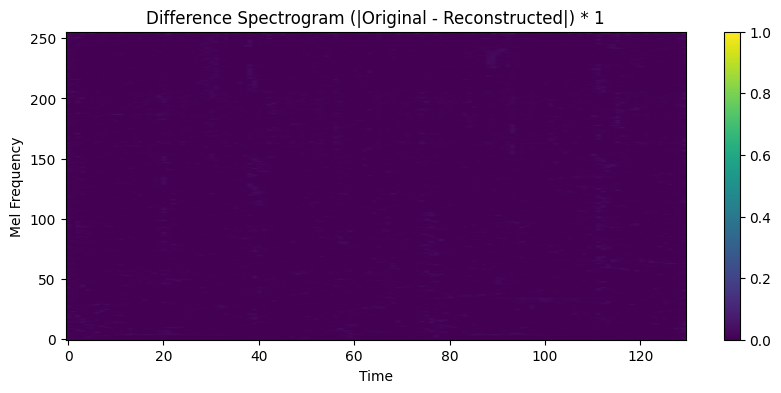

Loss:  1.2130718231201172
Reconstructed Audio with Genres: Piano, Contemporary Classical, Electronic


Reconstructed Audio with Genres: rock, pop


---------------------------------------------------------------------------------------------------- Connect all audio ----------------------------------------------------------------------------------------------------
Connect all original audio


Connect all reconstructed audio


In [ ]:
genres_list = ["rock", "pop"]
num_samples = 5
diff_level = 1

generate(model, testloader, genres_list, num_samples, diff_level)